# Final Exam (part 1) - Computational Physics 2

### Deadline: Friday 6 June 2025 (by 23h59)
### Credits: 10 points

### Please keep the structure provided below and submit an organised notebook with clear answers to each item.


## 1. Finite-difference method for quantum mechanics: Wave packets in a Parabolic Potential

Consider a quantum mechanical particle of mass $m$ constrained to move along the x-axis. Its dynamics are governed by the **time-dependent Schrödinger equation**:

$$i\hbar \frac{\partial \Psi(x,t)}{\partial t} = -\frac{\hbar^2}{2m} \frac{\partial^2 \Psi(x,t)}{\partial x^2} + V(x) \Psi(x,t)$$

where $\Psi(x,t)$ represents the quantum state of the particle, $\hbar$ is the reduced Planck constant, $m$ is the mass of the particle, and $V(x) = \frac{1}{2} m \omega^2 x^2$ is the one-dimensional quantum harmonic oscillator potential with $\omega$ representing the angular frequency of the oscillator.

### Initial Conditions:

At time $t=0$, you will explore two different initial wavefunctions for the particle:

1.  **Single Gaussian Wave Packet:** A localized wave packet with an initial momentum:

$$\Psi(x,0) = A e^{-\frac{(x-x_0)^2}{2\sigma^2}} e^{i p_0 x / \hbar}$$

where $x_0$ is the initial position, $\sigma$ is the width, and $p_0$ is the initial momentum. $A$ is a normalization constant.

2.  **Superposition of Two Gaussian Wave Packets:** It is formed by the sum of two distinct Gaussian wave packets:

$$\Psi(x,0) = A_1 e^{-\frac{(x-x_{0,1})^2}{2\sigma_1^2}} e^{i p_{0,1} x / \hbar} + A_2 e^{-\frac{(x-x_{0,2})^2}{2\sigma_2^2}} e^{i p_{0,2} x / \hbar}$$

where $x_{0,k}$ are initial positions, $\sigma_k$ are widths, $p_{0,k}$ are initial momenta for each packet, and $A_k$ are constants adjusted such that the total wavefunction $\Psi(x,0)$ is **normalised**, meaning $\int_{-\infty}^{\infty} |\Psi(x,0)|^2 dx = 1$.

### Boundary Conditions:

You will simulate the particle in a finite spatial domain, $[-L_x/2, L_x/2]$. At the boundaries of this domain, we will apply **Dirichlet boundary conditions**, meaning the wavefunction is identically zero: $\Psi(-L_x/2, t) = \Psi(L_x/2, t) = 0$.

### Tasks

Your goal is to develop and implement a numerical algorithm to solve the time-dependent Schrödinger equation using the **Crank-Nicolson method** that we reviewed in class:

#### (a) Mathematical derivation:

In a markdown cell, derive the discrete form of the time-dependent Schrödinger equation using the **Crank-Nicolson method**.

- Begin by discretising the spatial domain ($x_j = j \Delta x$) and time ($t_n = n \Delta t$).

- Use a central finite difference approximation for the second spatial derivative. Your derivation should lead to a matrix equation of the form $\mathbf{A} \Psi^{n+1} = \mathbf{B} \Psi^n$, where $\Psi^{n+1}$ and $\Psi^n$ are vectors of the wavefunction at interior grid points.

- Clearly define the elements of the tridiagonal matrices $\mathbf{A}$ and $\mathbf{B}$ in terms of $\hbar$, $m$, $\Delta x$, $\Delta t$, and $V_j$.

- Show how the discrete Hamiltonian operator $\mathbf{H}$ is represented within these matrices.

---

Following the instructions, we start by discretizing the equation in space and time:

$$
i\hbar \frac{\Psi_j^{n+1} - \Psi_j^n}{\Delta t} = -\frac{\hbar^2}{2m} \left( \frac{1}{2}\frac{\Psi_{j+1}^{n+1} - 2\Psi_j^{n+1} + \Psi_{j-1}^{n+1}}{(\Delta x)^2} + \frac{1}{2}\frac{\Psi_{j+1}^n - 2\Psi_j^n + \Psi_{j-1}^n}{(\Delta x)^2} \right) + \frac{1}{2} m \omega^2 x_j^2 \left(\frac{\Psi_j^{n+1} + \Psi_j^n}{2}\right).
$$

Now we can place all terms involving $\Psi^{n+1}$ on the left-hand side and those with $\Psi^n$ on the right-hand side, defining $r = \hbar^2/(4m (\Delta x)^2)$:
$$
r \Psi_{j+1}^{n+1} +\left(\frac{i\hbar}{\Delta t} - \frac{1}{4} m \omega^2 x_j^2 - 2r\right) \Psi_j^{n+1} + r \Psi_{j-1}^{n+1} = -r \Psi_{j+1}^n + \left(\frac{i\hbar}{\Delta t} + \frac{1}{4} m \omega^2 x_j^2 + 2r\right) \Psi_j^n - r \Psi_{j-1}^n.

$$

The resulting matrices are defined as follows:

$$
\mathbf{A} = \begin{pmatrix}
i\hbar/\Delta t - m \omega^2 x_1^2/4 - 2r & r & 0 & \cdots & 0 \\
r & i\hbar/\Delta t - m \omega^2 x_2^2/4 - 2r & r & \cdots & 0 \\
0 & r & i\hbar/\Delta t - m \omega^2 x_3^2/4 - 2r & \cdots & 0 \\
\vdots & \vdots & \vdots & \ddots & \vdots \\
0 & 0 & 0 & \cdots & i\hbar/\Delta t - m \omega^2 x_n^2/4 - 2r
\end{pmatrix},
$$
$$
\mathbf{B} = \begin{pmatrix}
i\hbar/\Delta t + m \omega^2 x_1^2/4 + 2r & -r & 0 & \cdots & 0 \\
-r & i\hbar/\Delta t + m \omega^2 x_2^2/4 + 2r & -r & \cdots & 0 \\
0 & -r & i\hbar/\Delta t + m \omega^2 x_3^2/4 + 2r & \cdots & 0 \\
\vdots & \vdots & \vdots & \ddots & \vdots \\
0 & 0 & 0 & \cdots & i\hbar/\Delta t + m \omega^2 x_n^2/4 + 2r
\end{pmatrix}.
$$

In this way, we can solve the system using the following matrix equation:
$$
\mathbf{A} \Psi^{n+1} = \mathbf{B} \Psi^n.
$$

**Note:** The Hamiltonian operator is given by
$$
\mathbf{H} = -\frac{\hbar^2}{2m (\Delta x)^2} + \frac{1}{2} m \omega^2 x_j^2,
$$

and there are a couple of ways in which it can be represented found within the matrices $\mathbf{A}$ and $\mathbf{B}$, but none of them seemed to make the expression simpler, so I decided to keep the matrices as they are.

---

#### (b) Python code implementation:

Use **python classes** to implement the numerical solution to the time-dependent Schrödinger equation. You will need to:

- Set up the physical constants, simulation parameters, spatial and temporal grids, and the potential. The simulation should be conducted using atomic units, where $\hbar = 1$ and $m = 1$. This simplifies the equations without loss of generality.

- Implement the initial conditions described above ensuring the proper normalisation of the initial wavefunctions. Remember that the wavefunction $\Psi$ is complex, so you should ensure that all calculations involving $\Psi$ handle complex numbers correctly.

- Construct the tridiagonal matrices $\mathbf{A}$ and $\mathbf{B}$ based on your derivations. Pay close attention to the boundary conditions. **Hint:** Use sparse matrices for computational efficiency.

- Implement a time evolution loop. At each time step, calculate the RHS vector $\mathbf{B} \Psi^n$. Solve the linear system $\mathbf{A} \Psi^{n+1} = (\text{RHS vector})$, and update the wavefunction array $\Psi$ for the next iteration, remembering to apply the boundary conditions.

In [1]:
# Libraries
import numpy as np
import matplotlib.pyplot as plt
from IPython.display import HTML
from matplotlib.animation import FuncAnimation

In [2]:
class WavePacketSolver:
    """
    Class to solve the evolution of a wave packet 
    in a parabolic potential using the Crank-Nicolson method.

    Parameters
    ----------
    dict_params : dict
        Dictionary containing the parameters for the wave packet and simulation.
        The keys are:
            'length' : float
                Length of the spatial domain.
            'num_points' : int
                Number of spatial points.
            'wp_params' : tuple
                Parameters for the wave packet. They can be:
                - Single: (x0, sigma, p0)   
                - Double: (x0_1, sigma1, p0_1, x0_2, sigma2, p0_2)
            'bcs' : tuple
                Boundary conditions at the edges of the domain.
            'omega' : float
                Frequency of the parabolic potential.
    """
    def __init__(self, dict_params: dict):
        """
        Initialize the class.
        """
        # If no params are provided
        if not dict_params:
            dict_params = {
                'length': 10.0,
                'num_points': 500,
                'wp_params': (0, 0.1, 1.0),
                'bcs': (0.0, 0.0),
                'omega': 1.0
            }

        # Read and set attributes
        length     = dict_params['length']
        num_points = dict_params['num_points']

        self.x     = np.linspace(-length / 2, length / 2, num_points)
        self.dx    = length / num_points

        self.omega = dict_params['omega']
        self.r     = 1 / (4 * self.dx**2)

        self.wp_params = dict_params['wp_params']
        self.bcs       = dict_params['bcs']

        # Setup initial conditions
        self._set_ics()

    def solve(self, 
              dt: float = 0.01, 
              t_max: float = 1.0) -> None:
        """
        Solve the wave packet evolution.

        Parameters
        ----------
        dt : float
            Time step for the simulation.
        t_max : float
            Maximum time for the simulation.

        Returns
        -------
        psi : np.ndarray
            The wave function at each time step.
        """
        # Make them attributes
        self.dt    = dt
        self.t_max = t_max

        # Initialize stuff
        self._solver_inits()

        # Time loop
        for j in range(1, len(self.t)):

            # Update the wave function
            self.psi[j, 1:-1] = np.linalg.solve(self.A, self.B @ self.psi[j-1, 1:-1])

            # Boundary conditions
            self.psi[j, 0]  = self.bcs[0]
            self.psi[j, -1] = self.bcs[1]

        return self.psi

    def _solver_inits(self) -> None:
        """
        Initialize time vector, wave function, and matrices for the solver.
        """
        # Time vector
        self.t = np.arange(0, self.t_max, self.dt)

        # Wave function
        self.psi       = np.zeros((len(self.t), len(self.x)), dtype = complex)
        self.psi[0]    = self.ics
        self.psi[:, 0] = self.bcs[0]  
        self.psi[:,-1] = self.bcs[1]

        # Set up matrices
        self._matrices()
    
    def _matrices(self) -> None:
        """
        Set up A and B matrices for the Crank-Nicolson method.
        """
        # Interior points
        interior = len(self.x) - 2

        # A matrix
        diag_term  = np.array([1j / self.dt - self.omega**2 * self.x[i + 1]**2 / 4 - 2 * self.r 
                               for i in range(interior)])
        diag       = np.diag(diag_term)
        diag_minus = np.diag([self.r] * (interior - 1), -1)
        diag_plus  = np.diag([self.r] * (interior - 1), 1)
        self.A     = diag + diag_minus + diag_plus

        # B matrix
        diag_term  = np.array([1j / self.dt + self.omega**2 * self.x[i + 1]**2 / 4 + 2 * self.r
                               for i in range(interior)])
        diag       = np.diag(diag_term)
        diag_minus = np.diag([-self.r] * (interior - 1), -1)
        diag_plus  = np.diag([-self.r] * (interior - 1), 1)
        self.B     = diag + diag_minus + diag_plus

    def _set_ics(self) -> None:
        """
        Set initial conditions based on the wave packet type.
        Normalization is carried out.
        """
        # Single wave packet
        if len(self.wp_params) == 3:

            # Extract parameters
            x0, sigma, p0 = self.wp_params

            # Create wave packet
            self.ics = np.exp(-(self.x - x0)**2 / (2 * sigma**2)) * np.exp(1j * self.x * p0)

        # Double wave packet
        elif len(self.wp_params) == 6:

            # Extract
            x0_1, sigma1, p0_1, x0_2, sigma2, p0_2 = self.wp_params

            # Create the superposition
            wp1 = np.exp(-(self.x - x0_1)**2 / (2 * sigma1**2)) * np.exp(1j * self.x * p0_1)
            wp2 = np.exp(-(self.x - x0_2)**2 / (2 * sigma2**2)) * np.exp(1j * self.x * p0_2)
            self.ics = wp1 + wp2

        else:
            raise ValueError("Invalid wave packet parameters. Must be 3 or 6 values.")
        
        # Normalize
        self.ics = self.ics / np.sqrt(np.sum(np.abs(self.ics)**2) * self.dx)

    def prob_density(self) -> np.ndarray:
        """
        Calculate the probability density.

        Returns
        -------
        prob_density : np.ndarray
            The probability density at each point in space.
        """
        # Compute
        prob_density = np.abs(self.psi)**2
        return prob_density
    
    def potential(self) -> np.ndarray:
        """
        Calculate the potential energy.

        Returns
        -------
        v : np.ndarray
            The potential energy at each point in space.
        """
        # Compute
        v = 0.5 * self.omega**2 * self.x**2
        return v

#### (c) Simulations:

Run your code for both initial conditions. First, you should run it for the **Single Gaussian Wave Packet** and then for the **Superposition of Two Gaussian Wave Packets**. For each case, you should:

- Generate a plot showing snapshots of the probability density $|\Psi(x,t)|^2$ at several times. Include the potential $V(x)$ on the same plot (scaled appropriately for visibility).

- Create a 2D map and a 3D representation showing the evolution of the probability density $|\Psi(x,t)|^2$ as a function of both position $x$ and time $t$. This plot should capture the entire simulation duration.

- Create animated visualisation of the probability density of the wave packet evolving in time. 

##### Single wave packet

We're going to place it at the origin with a width of $1$ and an initial momentum of $0.25$.

In [3]:
# Object
solver = WavePacketSolver(
    dict_params = {
        'length': 50.0,
        'num_points': 1000,
        'wp_params': (0, 1, 0.25), # (x0, sigma, p0)
        'bcs': (0.0 + 0j, 0.0 + 0j),
        'omega': 0.1
    }
)

# Solve
psi = solver.solve(
    dt = 0.1, 
    t_max = 20.0
    )

In [4]:
# Get probability density and potential
prob_density = solver.prob_density()
potential    = solver.potential()

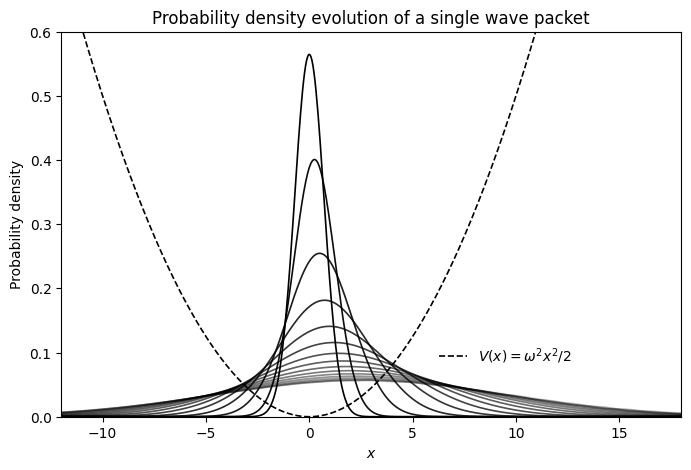

In [5]:
# Plot
plt.figure(figsize = (8, 5))

# Indices to plot
time_indices = [i for i in range(0, len(solver.t), 10)]

# Plot each
for idx in time_indices:
    plt.plot(solver.x, prob_density[idx], lw = 1.2, color = 'k',
             alpha = 1.0 * (1 - idx/max(time_indices)))
    
plt.plot(solver.x, potential, lw = 1.2, color = 'k', ls = '--', label = r"$V(x) = \omega^2 x^2/2$")

plt.title('Probability density evolution of a single wave packet')
plt.xlabel(r'$x$')
plt.ylabel('Probability density')
plt.xlim(-12, 18)
plt.ylim(0, 0.6)
plt.legend(frameon = False, loc = (0.60, 0.12))
plt.show()

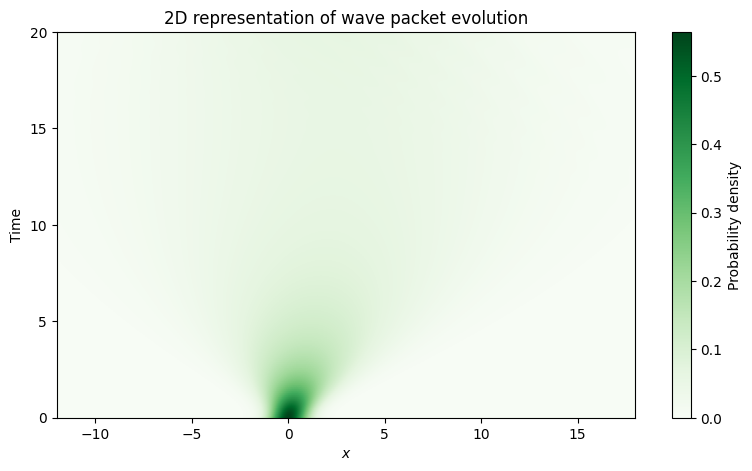

In [6]:
# Heatmap
plt.figure(figsize=(8, 5))
plt.imshow(prob_density, extent = [solver.x[0], solver.x[-1], 0, solver.t_max],
           cmap = 'Greens', origin = 'lower')

plt.colorbar(label = 'Probability density', shrink = 0.85)
plt.title('2D representation of wave packet evolution')
plt.ylabel('Time')
plt.xlabel(r'$x$')

plt.ylim(0, solver.t_max)
plt.xlim(-12, 18)
plt.yticks([0, 5, 10, 15, 20])

plt.tight_layout()
plt.show()

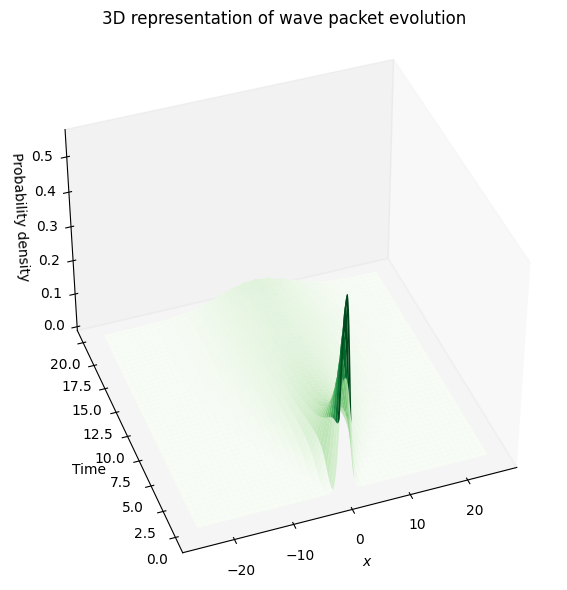

In [7]:
# 3D plot
fig = plt.figure(figsize=(7, 6))

ax = fig.add_subplot(111, projection = '3d')
X, T = np.meshgrid(solver.x, solver.t)
Z = prob_density

ax.plot_surface(X, T, Z, cmap = 'Greens')

ax.set_xlabel(r'$x$')
ax.set_ylabel('Time')
ax.set_zlabel('Probability density')
ax.set_title('3D representation of wave packet evolution')

ax.grid(False)
ax.view_init(elev = 40, azim = -110)

plt.tight_layout()
plt.show()

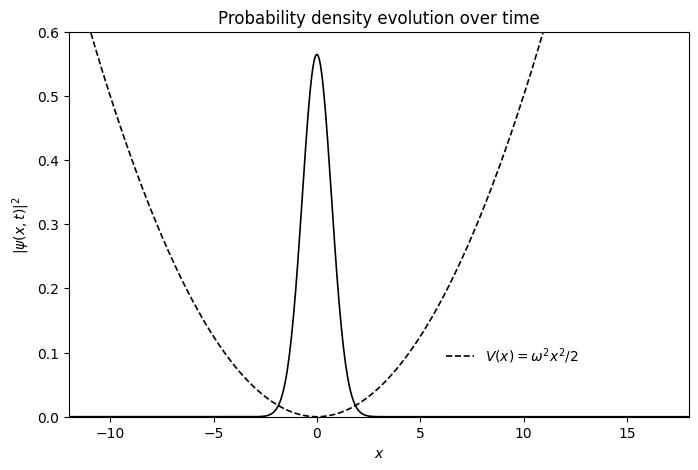

In [8]:
# We setup the animation with the first frame
fig, ax = plt.subplots(figsize = (8, 5))
line, = ax.plot(solver.x, prob_density[0], lw = 1.2, color = 'k')

# Potential
ax.plot(solver.x, potential, lw = 1.2, color = 'k', ls = '--', label = r"$V(x) = \omega^2 x^2/2$")

ax.set_title('Probability density evolution over time')
ax.set_xlabel(r'$x$')
ax.set_ylabel(r'$|\psi(x, t)|^2$')

ax.set_xlim(-12, 18)
ax.set_ylim(0, 0.6)

ax.legend(frameon = False, loc = (0.60, 0.12))

# Function
def update(frame):
    line.set_ydata(prob_density[frame])
    ax.set_title('Density evolution over time, ' + r"$t = $" + f"{solver.t[frame]:.2f}")
    return line,

In [9]:
# Construct the animation
ani = FuncAnimation(
    fig, 
    update, 
    frames = 100,
    blit = True, 
    interval=100
    )

# Display
HTML(ani.to_jshtml())

##### Superposition of two wave packets
We'll set similar parameters for both, but the momentum is going to be opposite and towards the other.

In [10]:
# Object
solver2 = WavePacketSolver(
    dict_params = {
        'length': 100.0,
        'num_points': 1000,
        'wp_params': (-5, 1.0, 1.0, 5, 1.0, -1.0), # (x0_1, sigma1, p0_1, x0_2, sigma2, p0_2)
        'bcs': (0.0 + 0j, 0.0 + 0j),
        'omega': 0.1
    }
)

# Solve
psi_2 = solver2.solve(
    dt = 0.1, 
    t_max = 20.0
    )

In [11]:
# Arrays
prob_density_2 = solver2.prob_density()
potential_2    = solver2.potential()

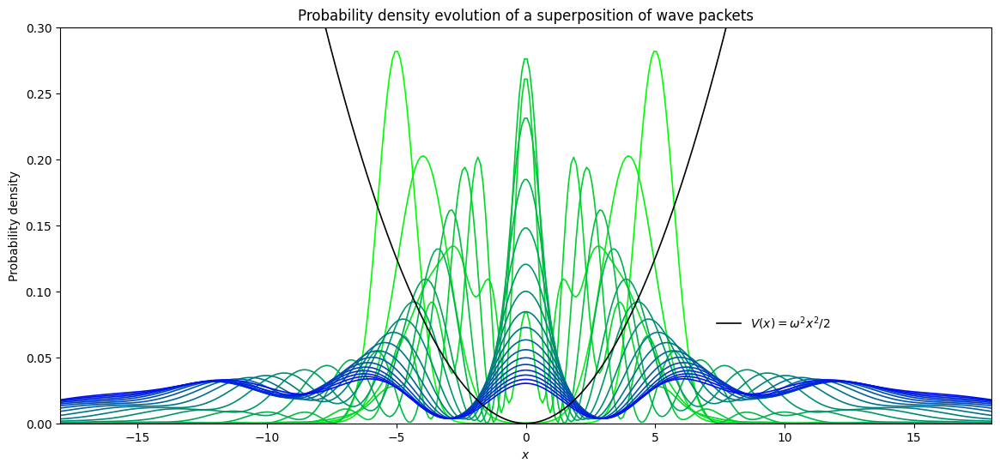

In [12]:
# Plot
plt.figure(figsize = (14, 6))

# Indices to plot
time_indices_2 = [i for i in range(0, len(solver2.t), 10)]

G = np.linspace(1, 0, len(solver2.t))
B = np.linspace(0, 1, len(solver2.t))
R = 0

# Plot each
for idx in time_indices_2:
    plt.plot(solver2.x, prob_density_2[idx], lw = 1.2, color = [R, G[idx], B[idx]])
    
plt.plot(solver2.x, potential_2, lw = 1.2, color = 'k', label = r"$V(x) = \omega^2 x^2/2$")

plt.title('Probability density evolution of a superposition of wave packets')
plt.xlabel(r'$x$')
plt.ylabel('Probability density')
plt.xlim(-18, 18)
plt.ylim(0, 0.3)
plt.legend(frameon = False, loc = (0.70, 0.22))
plt.show()

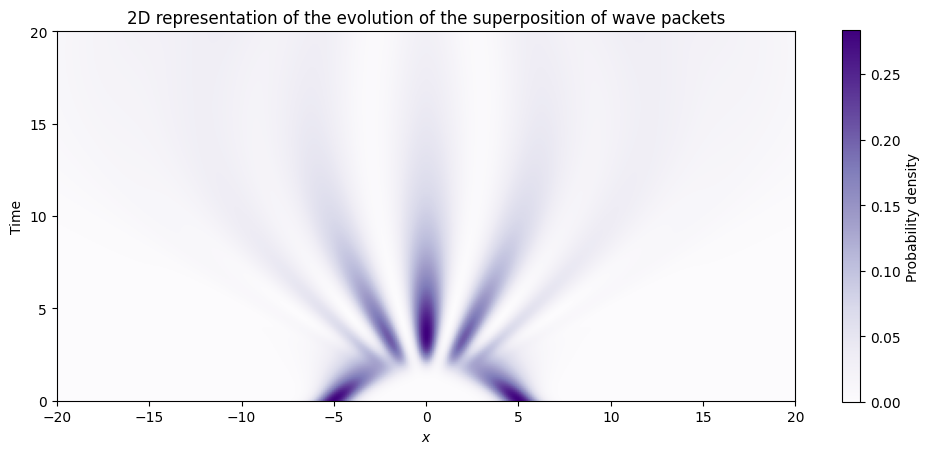

In [13]:
# Heatmap
plt.figure(figsize = (10, 5))
plt.imshow(prob_density_2, extent = [solver2.x[0], solver2.x[-1], 0, solver.t_max],
           cmap = 'Purples', origin = 'lower')

plt.colorbar(label = 'Probability density', shrink = 0.80)
plt.title('2D representation of the evolution of the superposition of wave packets')
plt.ylabel('Time')
plt.xlabel(r'$x$')

plt.ylim(0, solver2.t_max)
plt.xlim(-20, 20)
plt.yticks([0, 5, 10, 15, 20])

plt.tight_layout()
plt.show()

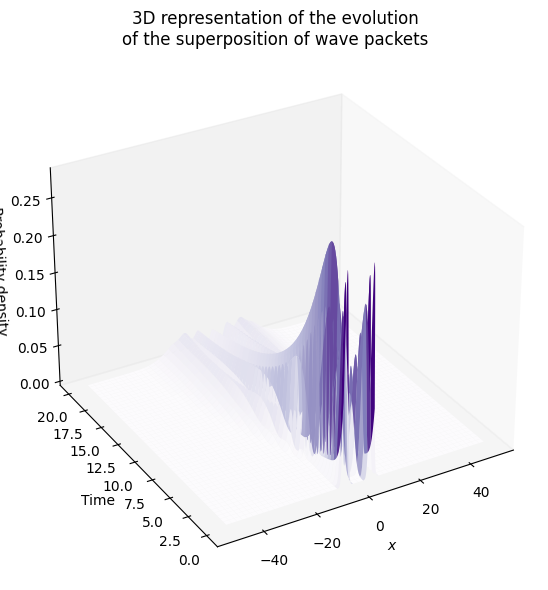

In [14]:
# 3D plot
fig = plt.figure(figsize=(7, 6))

ax = fig.add_subplot(111, projection = '3d')
X, T = np.meshgrid(solver2.x, solver2.t)
Z = prob_density_2

ax.plot_surface(X, T, Z, cmap = 'Purples')

ax.set_xlabel(r'$x$')
ax.set_ylabel('Time')
ax.set_zlabel('Probability density')
ax.set_title('3D representation of the evolution\n' + 'of the superposition of wave packets')

ax.grid(False)
ax.view_init(elev = 30, azim = -120)

plt.tight_layout()
plt.show()

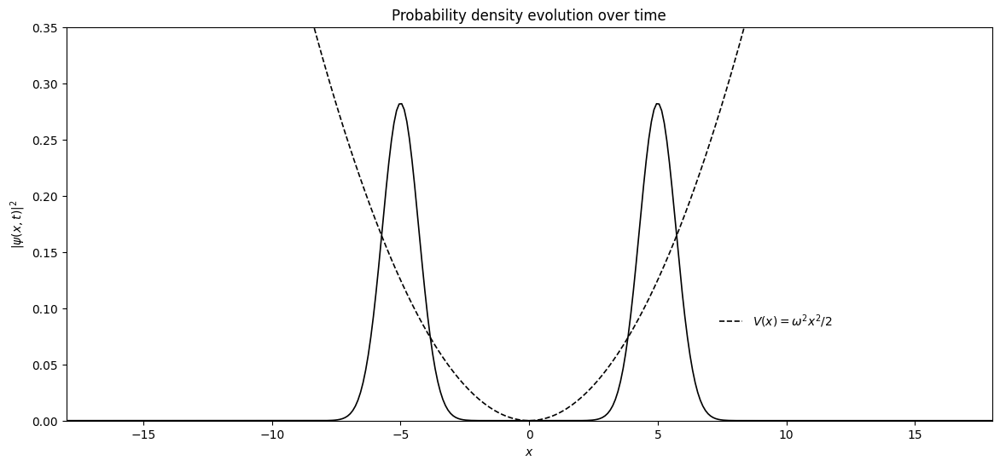

In [15]:
# We setup the animation with the first frame
fig2, ax = plt.subplots(figsize = (14, 6))
line, = ax.plot(solver2.x, prob_density_2[0], lw = 1.2, color = 'k')

# Potential
ax.plot(solver2.x, potential_2, lw = 1.2, color = 'k', ls = '--', label = r"$V(x) = \omega^2 x^2/2$")

ax.set_title('Probability density evolution over time')
ax.set_xlabel(r'$x$')
ax.set_ylabel(r'$|\psi(x, t)|^2$')

ax.set_xlim(-18, 18)
ax.set_ylim(0, 0.35)

ax.legend(frameon = False, loc = (0.70, 0.22))

# Function
def update2(frame):
    line.set_ydata(prob_density_2[frame])
    ax.set_title('Density evolution over time, ' + r"$t = $" + f"{solver2.t[frame]:.2f}")
    return line,

In [16]:
# Construct the animation
ani = FuncAnimation(
    fig2, 
    update2, 
    frames = 150,
    blit = True, 
    interval=150
    )

# Display
HTML(ani.to_jshtml())

#### (d) Analysis:

- Compare the dynamics of the single Gaussian wave packet versus the superposition of two Gaussians. In particular, discuss what phenomena occur when the two Gaussian components of the superposition interact.

- Calculate and report the total probability (norm) $\sum_j |\Psi_j^{N_t}|^2 \Delta x$ at the final time step of each simulation. Compare it to the initial norm. Discuss if the Crank-Nicolson method conserves the norm, and why small deviations might still occur in practice.

---
The single Gaussian wave packet diffuses over time, becoming wider and spreading out, as expected from quantum mechanics. The superposition of two Gaussian wave packets exhibits interference patterns, where the two packets can constructively or destructively interfere. This leads to a more complex evolution, but as time progresses, the superposition also tends to spread out, similar to the single wave packet.

---


In [17]:
# Let's calculate the probabilities
single_prob0 = np.sum(prob_density[0]) * solver.dx
single_probf = np.sum(prob_density[-1]) * solver.dx

double_prob0 = np.sum(prob_density_2[0]) * solver2.dx
double_probf = np.sum(prob_density_2[-1]) * solver2.dx

In [18]:
# Print
print("Single wave packet:")
print(f"Initial probability: {single_prob0:.4f}")
print(f"Final probability: {single_probf:.4f}")
print("\nSuperposition of wave packets:")
print(f"Initial probability: {double_prob0:.4f}")
print(f"Final probability: {double_probf:.4f}")


Single wave packet:
Initial probability: 1.0000
Final probability: 1.0000

Superposition of wave packets:
Initial probability: 1.0000
Final probability: 1.0000


The norms are conserved in both cases. However, small deviations can still occur due to numerical errors such as round-off errors or truncation errors in the numerical method, and the fact it's numerical and not analytical.